# Introduction

<center><img src="https://i.imgur.com/vSUSbDf.jpg" width="500px"></center>

Welcome to the "Plant Pathology 2020 - FGVC7" competition! In this competition, contestants are challenged to diagnose plant diseases solely based on leaf images. The categories include "healthy", "scab", "rust", and "multiple diseases". Solving this problem is important because diagnosing plant diseases early can save tonnes of agricultural produce every year. This will benefit not only the general population by reducing hunger, but also the farmers by ensuring they get the harvest they deserve.

In this kernel, I will visualize the data with Matplotlib and Plotly and then demonstrate some important image processing and augmentation techniques using OpenCV. Finally, I will show how different pretrained Keras models, such as DenseNet and EfficientNet, can be used to solve the problem.

To get started, here is an excellent video about how data scientists use TensorFlow to detect diseases in Cassava plants in Africa:

# Contents

* [<font size=4>EDA</font>](#1)
    * [Preparing the ground](#1.1)
    * [Visualize one leaf](#1.2)
    * [Channel distributions](#1.3)
    * [Visualize sample leaves](#1.4)
    * [Visualize targets](#1.5)


* [<font size=4>Image processing and augmentation</font>](#2)
    * [Canny edge detection](#2.1)
    * [Flipping](#2.2)
    * [Convolution](#2.3)
    * [Blurring](#2.4)
  

* [<font size=4>Modeling</font>](#3)
    * [Preparing the ground](#3.1)
    * [DenseNet](#3.2)
    * [EfficientNet](#3.3)
    * [EfficientNet NoisyStudent](#3.4)
    * [Ensembling](#3.5)


* [<font size=4>Takeaways</font>](#4)


* [<font size=4>Ending note</font>](#5)

# EDA <a id="1"></a>

## Preparing the ground <a id="1.1"></a>

### Install and import necessary libraries

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import torch

from tqdm import tqdm
tqdm.pandas()
import matplotlib.cm as cm
from sklearn import metrics
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

# import plotly.express as px
# import plotly.graph_objects as go
# import plotly.figure_factory as ff
# from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings("ignore")

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [3]:
import random
seed = 50
os.environ['PYTHONHASHSEED'] = str(seed)
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

In [4]:
path = '/home/logan/Documents/ThayHuy/final/data/'

In [5]:
TRAIN_PATH = path + "train.csv"
train = pd.read_csv(TRAIN_PATH)

In [6]:
TEST_PATH = path + "test.csv"
test_data = pd.read_csv(TEST_PATH)

In [7]:
train.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


healthy              516
multiple_diseases     91
rust                 622
scab                 592
dtype: object


<Axes: >

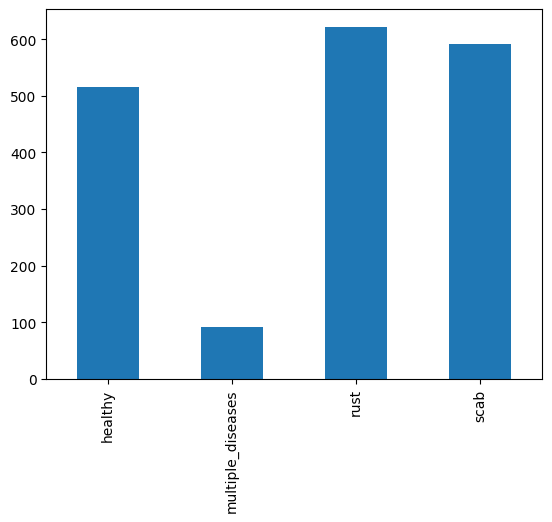

In [8]:
print(train.sum(axis=0)[['healthy', 'multiple_diseases', 'rust', 'scab']])
train.sum(axis=0)[['healthy', 'multiple_diseases', 'rust', 'scab']].plot.bar()

In [9]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cv2

def show_image(img_ids, rows=2, cols=3):
    assert len(img_ids) <= rows * cols
    
    plt.figure(figsize=(15,8))
    grid = gridspec.GridSpec(rows, cols)
    
    for idx, img_id in enumerate(img_ids):
        img_path = f'{path}images/{img_id}.jpg'
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        ax = plt.subplot(grid[idx])
        ax.imshow(image)

healthy_img_ids = train[train['healthy']==1]['image_id'][-6:]
multi_img_ids = train[train['multiple_diseases']==1]['image_id'][-6:]
rust_img_ids = train[train['rust']==1]['image_id'][-6:]
scab_img_ids = train[train['scab']==1]['image_id'][-6:]

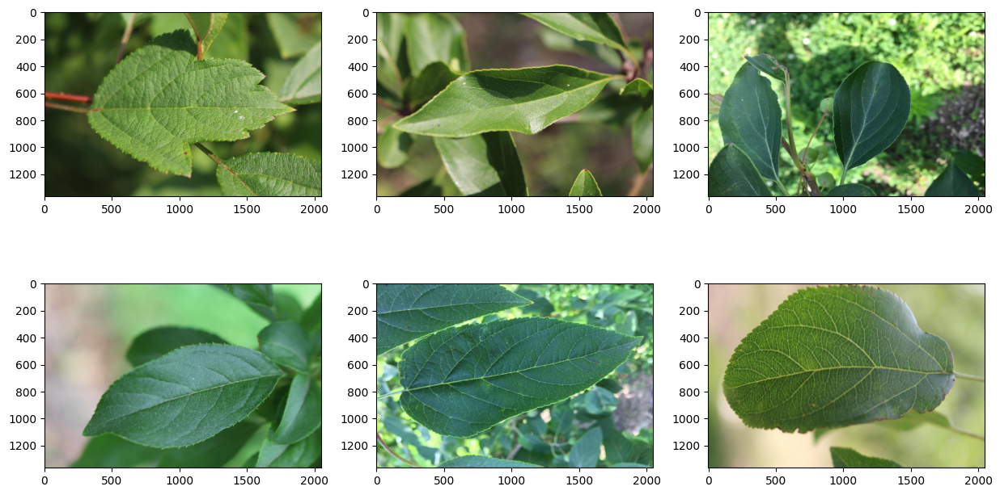

In [10]:
show_image(healthy_img_ids)

In the above images, we can see that the healthy leaves are completely green, do not have any brown/yellow spots or scars. Healthy leaves do not have scab or rust. 

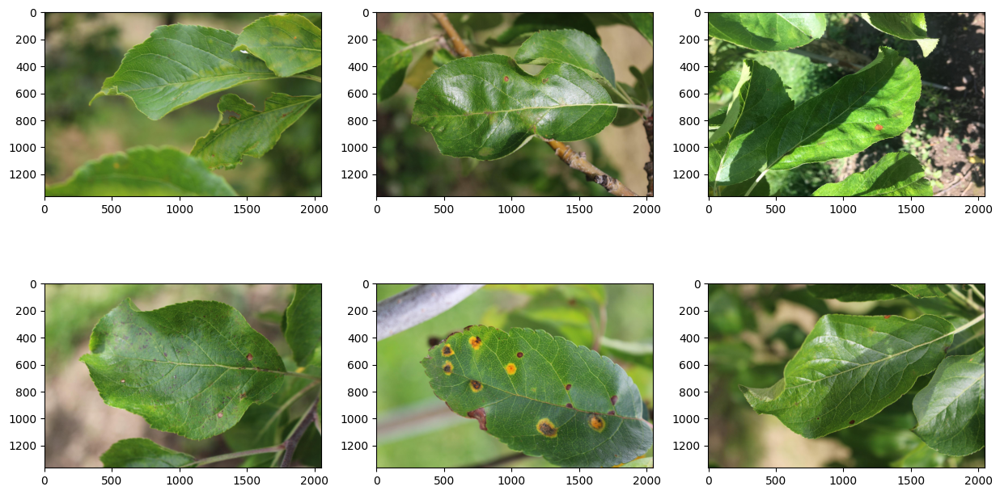

In [11]:
show_image(multi_img_ids)

In the above images, we can see that the leaves show symptoms for several diseases, including brown marks and yellow spots. These plants have more than one of the above-described diseases.

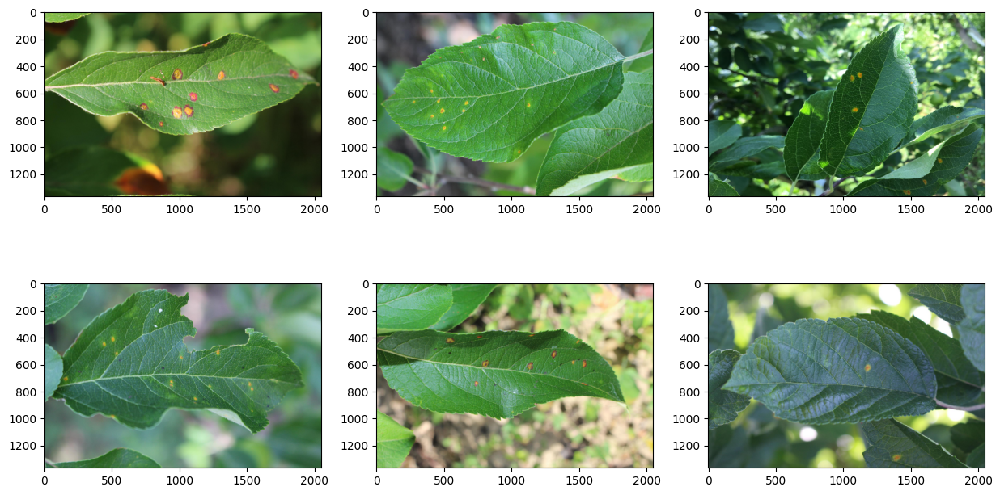

In [12]:
show_image(rust_img_ids)

In the above images, we can see that leaves with "rust" have several brownish-yellow spots across the leaf. Rust is defined as "a disease, especially of cereals and other grasses, characterized by rust-colored pustules of spores on the affected leaf blades and sheaths and caused by any of several rust fungi". The yellow spots are a sign of infection by a special type of fungi called "rust fungi". Rust can also be treated with several chemical and non-chemical methods once diagnosed.

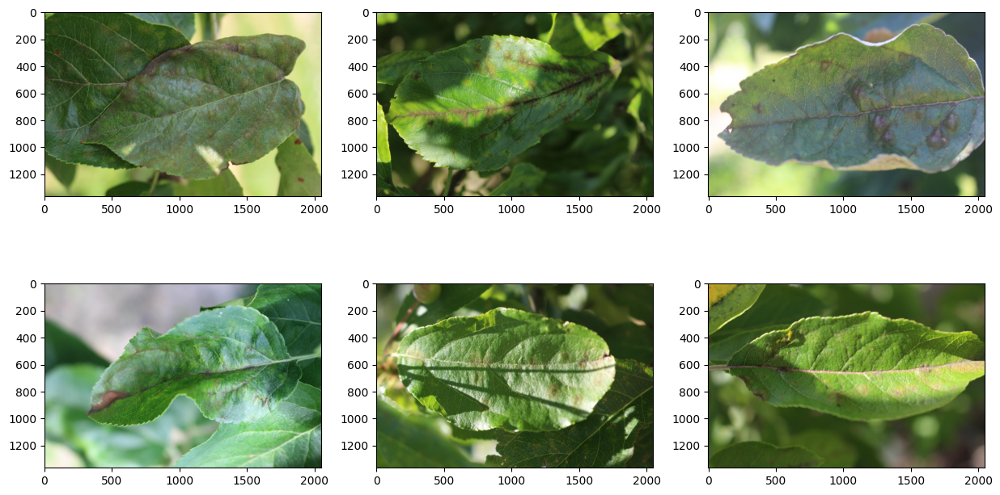

In [13]:
show_image(scab_img_ids)

In the above images, we can see that leaves with "scab" have large brown marks and stains across the leaf. Scab is defined as "any of various plant diseases caused by fungi or bacteria and resulting in crustlike spots on fruit, leaves, or roots. The spots caused by such a disease". The brown marks across the leaf are a sign of these bacterial/fungal infections. Once diagnosed, scab can be treated using chemical or non-chemical methods.

In [8]:
test_data.head()

,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4


In [14]:
from torch.utils.data import Dataset

class ImageDataset(Dataset):
    def __init__(self, df, img_dir='./', transform=None, is_test=False):
        super().__init__() 
        self.df = df
        self.img_dir = img_dir
        self.transform = transform
        self.is_test = is_test
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        img_id = self.df.iloc[idx, 0]             
        img_path = self.img_dir + img_id + '.jpg'
        image = cv2.imread(img_path)              
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.transform is not None:
            image = self.transform(image=image)['image']

        if self.is_test:
            return image 
        else:
            label = np.argmax(self.df.iloc[idx, 1:5]) 
            return image, label

In [15]:
img_dir = '/home/logan/Documents/ThayHuy/final/data/images/'

In [16]:
def load_image(image_id):
    file_path = image_id + ".jpg"
    image = cv2.imread(img_dir + file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

train_images = train["image_id"][:100].progress_apply(load_image)

100%|██████████| 100/100 [00:02<00:00, 47.73it/s]


# Image processing and augmentation <a id="2"></a>

## Canny edge detection <a id="2.1"></a>

Canny is a popular edge detection algorithm, and as the name suggests, it detects the edges of objects present in an image. It was developed by John F. Canny in 1986. The algorithm involves several steps.

1. **Noise reduction:** Since edge detection is susceptible to noise in an image, we remove the noise in the image using a 5x5 Gaussian filter.


2. **Finding Intensity Gradient of the Image**: The smoothened image is then filtered with a Sobel kernel in both horizontal and vertical directions to get the first derivative in the horizontal (*G<sub>x</sub>*) and vertical (*G<sub>y</sub>*) directions. From these two images, one can find the edge gradient and direction for each pixel:

<center><img src="https://i.imgur.com/ntyjTep.png" width="300px"></center>
<center><img src="https://i.imgur.com/75qDjv6.png" width="260px"></center>

<br>

3. **Rounding:** The gradient is always perpendicular to edges. So, it is rounded to one of the four angles representing vertical, horizontal and two diagonal directions.

4. **Non-maximum suppression:** After getting the gradient magnitude and direction, a full scan of the image is done to remove any unwanted pixels which may not constitute the edge. For this, we check every pixel for being a local maximum in its neighborhood in the direction of the gradient.

5. **Hysteresis Thresholding:** This stage decides which parts are edges and which are not. For this, we need two threshold values, *minVal* and *maxVal*. Any edges with intensity gradient greater than *maxVal* are considered edges and those lesser than *minVal* are considered non-edges, and discarded. Those who lie between these two thresholds are classified edges or non-edges based on their neighborhood. If they are near “sure-edge” pixels, they are considered edges, and otherwise, they are discarded.

The result of these five steps is a two-dimensional binary map (0 or 255) indicating the location of edges on the image. Canny edge is demonstrated below with a few leaf images:

In [17]:
def edge_and_cut(img):
    emb_img = img.copy()
    edges = cv2.Canny(img, 100, 200)
    edge_coors = []
    for i in range(edges.shape[0]):
        for j in range(edges.shape[1]):
            if edges[i][j] != 0:
                edge_coors.append((i, j))
    
    row_min = edge_coors[np.argsort([coor[0] for coor in edge_coors])[0]][0]
    row_max = edge_coors[np.argsort([coor[0] for coor in edge_coors])[-1]][0]
    col_min = edge_coors[np.argsort([coor[1] for coor in edge_coors])[0]][1]
    col_max = edge_coors[np.argsort([coor[1] for coor in edge_coors])[-1]][1]
    new_img = img[row_min:row_max, col_min:col_max]
    
    emb_img[row_min-10:row_min+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_max-10:row_max+10, col_min:col_max] = [255, 0, 0]
    emb_img[row_min:row_max, col_min-10:col_min+10] = [255, 0, 0]
    emb_img[row_min:row_max, col_max-10:col_max+10] = [255, 0, 0]
    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 20))
    ax[0].imshow(img, cmap='gray')
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(edges, cmap='gray')
    ax[1].set_title('Canny Edges', fontsize=24)
    ax[2].imshow(emb_img, cmap='gray')
    ax[2].set_title('Bounding Box', fontsize=24)
    plt.show()

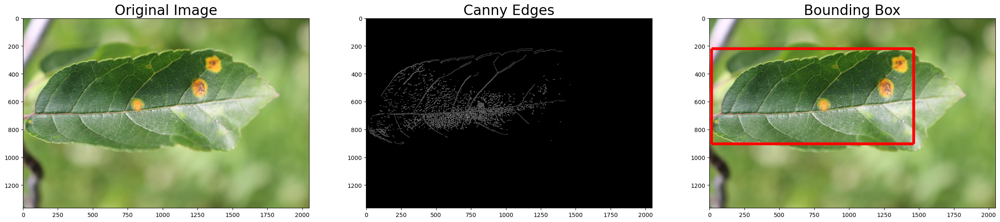

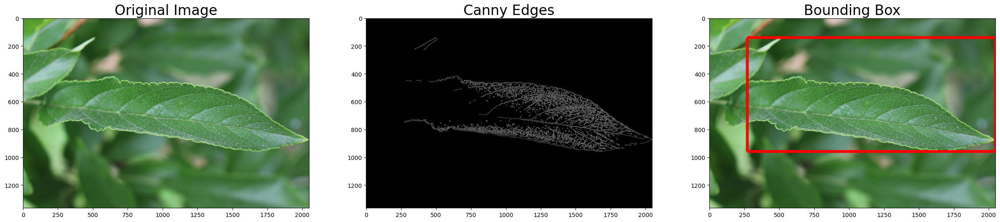

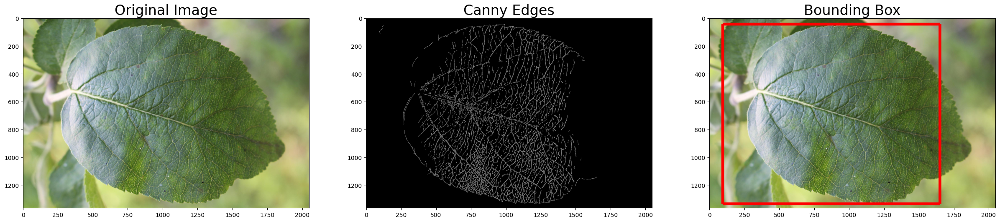

In [18]:
edge_and_cut(train_images[3])
edge_and_cut(train_images[4])
edge_and_cut(train_images[5])

The second column of images above contains the Canny edges and the third column contains cropped images. I have taken the Canny edges and used it to predict a bounding box in which the actual leaf is contained. The most extreme edges at the four corners of the image are the vertices of the bounding box. This red box is likely to contain most of if not all of the leaf. These edges and bounding boxes can be used to build more accurate models.

## Flipping <a id="2.2"></a>

Flipping is a simple transformation that involves index-switching on the image channels. In vertical flipping, the order of rows is exchanged, whereas in vertical flipping, the order of rows is exchanged. Let us assume that *A<sub>ijk</sub>* (of size *(m, n, 3)*) is the image we want to flip. Horizontal and vertical flipping can be represented by the transformations below:

<center><img src="https://i.imgur.com/B9y5apl.png" width="135px"></center>
<center><img src="https://i.imgur.com/eQ1dyvN.png" width="305px"></center>
<center><img src="https://i.imgur.com/i30LQgq.png" width="305px"></center>
<br>

We can see that the order of columns is exchanged in horizontal flipping. While the *i* and *k* indices remain the same, the *j* index reverses. Whereas, in vertical flipping, the order of rows is exchanged in horizontal flipping. While the *j* and *k* indices remain the same, the *i* index reverses.



In [19]:
def invert(img):
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(30, 20))
    ax[0].imshow(img)
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(cv2.flip(img, 0))
    ax[1].set_title('Vertical Flip', fontsize=24)
    ax[2].imshow(cv2.flip(img, 1))
    ax[2].set_title('Horizontal Flip', fontsize=24)
    plt.show()

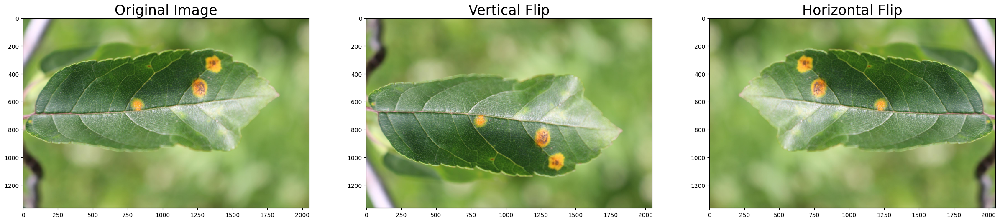

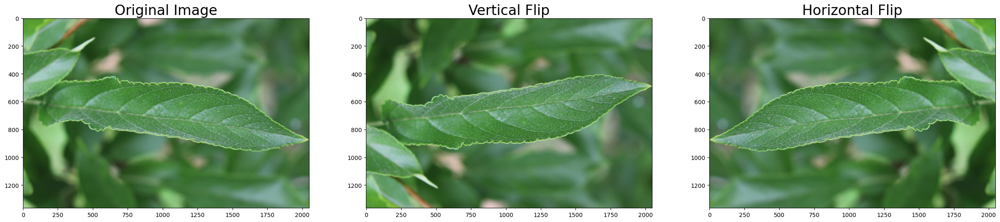

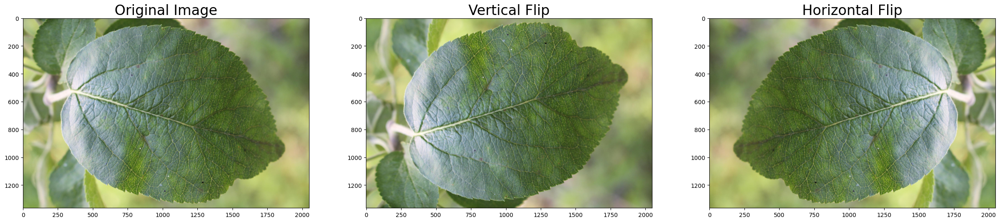

In [20]:
invert(train_images[3])
invert(train_images[4])
invert(train_images[5])

We can see that the images are simply flipped. All major features in the image remain the same, but to a computer algorithm, the flipped images look completely different. These transformations can be used for data augmentation, making models more robust and accurate.

## Convolution <a id="2.3"></a>

Convolution is a rather simple algorithm which involves a kernel (a 2D matrix) which moves over the entire image, calculating dot products with each window along the way. The GIF below demonstrates convolution in action.

<center><img src="https://i.imgur.com/wYUaqR3.gif" width="450px"></center>

The above process can be summarized with an equation, where *f* is the image and *h* is the kernel. The dimensions of *f* are *(m, n)* and the kernel is a square matrix with dimensions smaller than *f*:

<center><img src="https://i.imgur.com/9scTOGv.png" width="350px"></center>
<br>

In the above equation, the kernel *h* is moving across the length and breadth of the image. The dot product of *h* with a sub-matrix or window of matrix *f* is taken at each step, hence the double summation (rows and columns). Below I demonstrate the effect of convolution on leaf images.

In [21]:
def conv(img):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))
    kernel = np.ones((7, 7), np.float32)/25
    conv = cv2.filter2D(img, -1, kernel)
    ax[0].imshow(img)
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(conv)
    ax[1].set_title('Convolved Image', fontsize=24)
    plt.show()

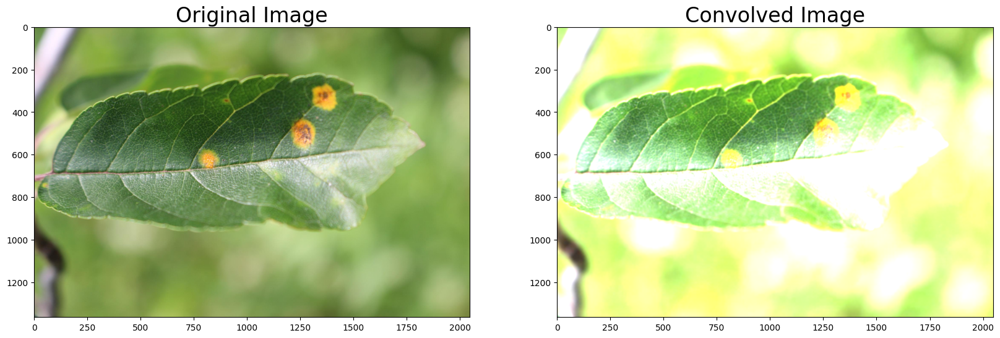

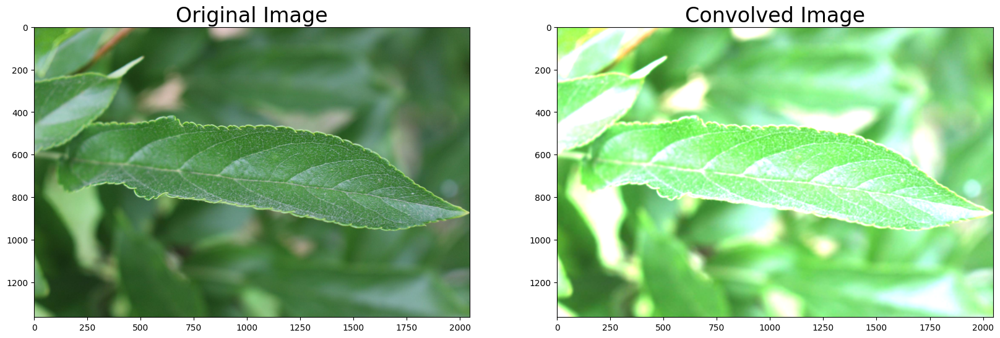

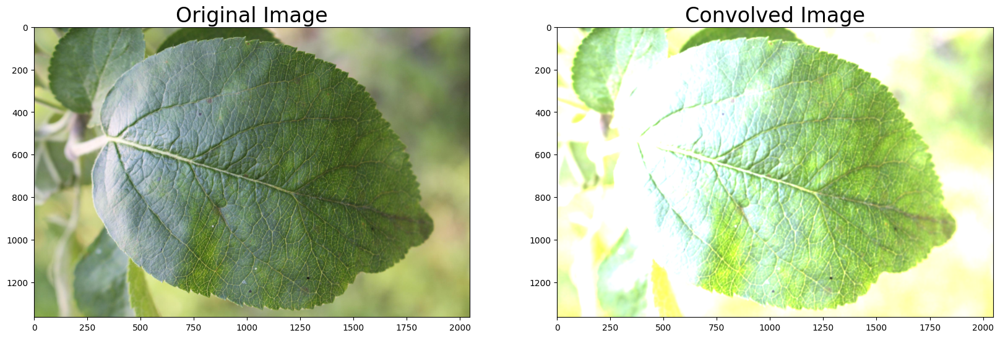

In [22]:
conv(train_images[3])
conv(train_images[4])
conv(train_images[5])

The convolution operator seems to have an apparent "sunshine" effect of the images. This may also serve the purpose of augmenting the data, thus helping to build more robust and accurate models. 

## Blurring <a id="2.4"></a>

Blurring is simply the addition of noise to the image, resulting in a less-clear image. The noise can be sampled from any distribution of choice, as long as the main content in the image does not become invisible. Only the minor details get obfuscated due to blurring. The blurring transformation can be represented using the equation below. 

<center><img src="https://i.imgur.com/zVM8HCU.png" width="220px"></center>
<br>

The example uses a Gaussian distribution with mean 0 and variance 0.1. Below I demonstrate the effect of blurring on a few leaf images:

In [23]:
def blur(img):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))
    ax[0].imshow(img)
    ax[0].set_title('Original Image', fontsize=24)
    ax[1].imshow(cv2.blur(img, (100, 100)))
    ax[1].set_title('Blurred Image', fontsize=24)
    plt.show()

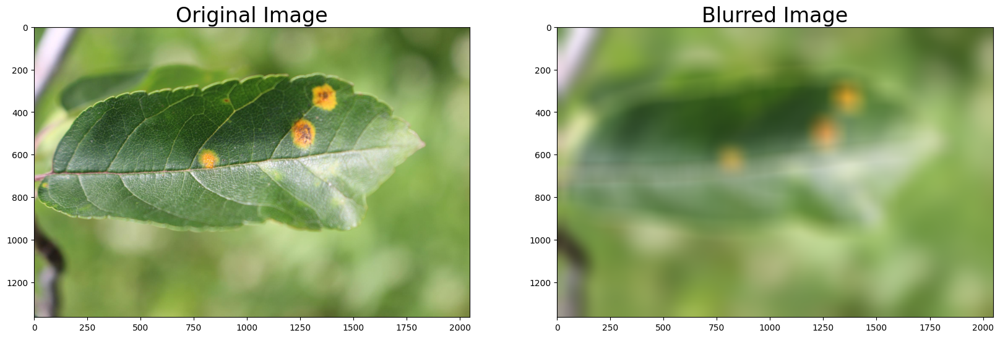

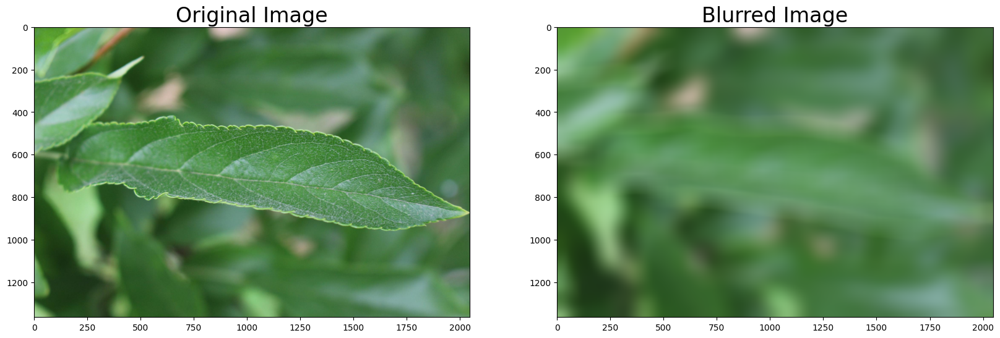

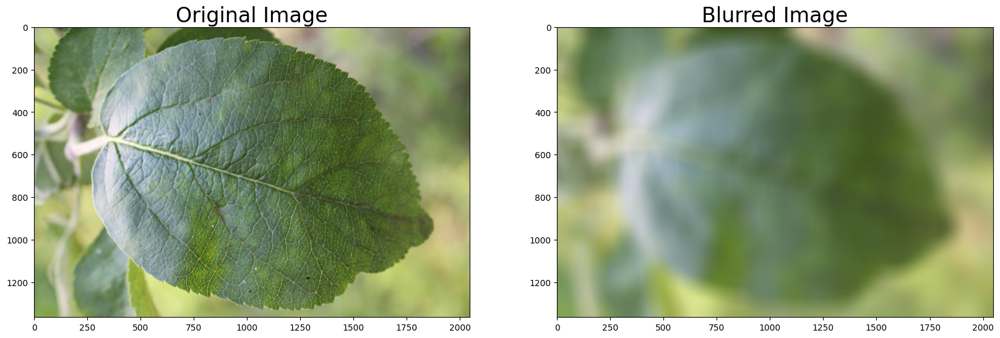

In [24]:
blur(train_images[3])
blur(train_images[4])
blur(train_images[5])

The transformation clearly blurs the image by removing detailed, low-level features, while retaining the major, high-level features. This is once again a great way to augment images and train more robust models.

# Modeling <a id="3"></a>

In [25]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

transform_train = A.Compose([
    A.Resize(450, 650),      
    A.RandomBrightnessContrast(brightness_limit=0.2, 
                               contrast_limit=0.2, p=0.3),
    A.VerticalFlip(p=0.2),    
    A.HorizontalFlip(p=0.5),  
    A.ShiftScaleRotate(       
        shift_limit=0.1,
        scale_limit=0.2,
        rotate_limit=30, p=0.3),
    A.OneOf([A.Emboss(p=1),   
             A.Sharpen(p=1),
             A.Blur(p=1)], p=0.3),
    A.PiecewiseAffine(p=0.3), 
    A.Normalize(),            
    ToTensorV2()              
])

transform_test = A.Compose([
    A.Resize(450, 650), 
    A.Normalize(),      
    ToTensorV2()        
])

In [26]:
from sklearn.model_selection import train_test_split

_, valid = train_test_split(train, 
                            test_size=0.1,
                            stratify=train[['healthy', 'multiple_diseases', 'rust', 'scab']],
                            random_state=50)

dataset_train = ImageDataset(train, img_dir=img_dir, transform=transform_train)
dataset_valid = ImageDataset(valid, img_dir=img_dir, transform=transform_test)

In [27]:
def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % 2**32
    np.random.seed(worker_seed)
    random.seed(worker_seed)
    
g = torch.Generator()
g.manual_seed(0)

from torch.utils.data import DataLoader

batch_size = 8

loader_train = DataLoader(dataset_train, batch_size=batch_size, 
                          shuffle=True, worker_init_fn=seed_worker,
                          generator=g, num_workers=2)
loader_valid = DataLoader(dataset_valid, batch_size=batch_size, 
                          shuffle=False, worker_init_fn=seed_worker,
                          generator=g, num_workers=2)

In [28]:
model = torch.hub.load('hankyul2/EfficientNetV2-pytorch', 'efficientnet_v2_s', pretrained=False)

model = model.to(device)

Using cache found in /home/logan/.cache/torch/hub/hankyul2_EfficientNetV2-pytorch_main


In [29]:
import torch.nn as nn

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(model.parameters(), lr=0.00006, weight_decay=0.0001)

In [30]:
from transformers import get_cosine_schedule_with_warmup

epochs = 20

# scheduler setting
# optimizer: torch.optim.AdamW
# num_warmup_steps: number of steps to increase the learning rate(lr) gradually to the value we set before
# num_training_steps: total number of steps to training = batches * epochs
scheduler = get_cosine_schedule_with_warmup(optimizer,
                                           num_warmup_steps=len(loader_train)*3,
                                           num_training_steps=len(loader_train)*epochs)

In [35]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

best_val_loss = float('inf')

for epoch in range(epochs):
    # == [ train phase ] ==============================================
    model.train()        
    epoch_train_loss = 0 
    
    for images, labels in tqdm(loader_train):
        
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad() # reset weights of the model in optimizer
        outputs = model(images) # deliver batch of images to the model and get outputs
        loss = criterion(outputs, labels) # calculate the loss
        
        epoch_train_loss += loss.item() 
        loss.backward() # backpropagation
        optimizer.step() # update weights
        scheduler.step() # update scheduler
    
    print(f'epoch [{epoch+1}/{epochs}] - train loss : {epoch_train_loss/len(loader_train):.4f}')
    
    # == [ validation phase ] ==============================================
    model.eval() # set the model to evaluation mode
    epoch_valid_loss = 0  
    preds_list = []       
    true_onehot_list = [] 
    
    # fix weights
    model.eval()  # Set the model to evaluation mode
    epoch_valid_loss = 0
    all_preds = []
    all_labels = []
    
    # Fix weights
    with torch.no_grad():
        for images, labels in loader_valid:
            images = images.to(device)
            labels = labels.to(device)
    
            outputs = model(images)
            loss = criterion(outputs, labels)
            epoch_valid_loss += loss.item()
    
            # Collect predictions and labels
            preds = torch.softmax(outputs.cpu(), dim=1).numpy()
            true_onehot = torch.eye(outputs.shape[1])[labels.cpu()].numpy()
    
            all_preds.extend(preds)
            all_labels.extend(true_onehot)
    
    # Convert predictions and labels to class indices
    all_preds_classes = np.argmax(all_preds, axis=1)  # Convert probabilities to class predictions
    all_labels_classes = np.argmax(all_labels, axis=1)

    avg_val_loss = epoch_valid_loss / len(loader_valid)

    if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), 'best_model.pth')
            print(f'Best model saved with validation loss: {best_val_loss:.4f}')
        
    # Calculate metrics
    accuracy = accuracy_score(all_labels_classes, all_preds_classes)
    f1 = f1_score(all_labels_classes, all_preds_classes, average='weighted')
    precision = precision_score(all_labels_classes, all_preds_classes, average='weighted')
    recall = recall_score(all_labels_classes, all_preds_classes, average='weighted')
    
    # Print metrics
    print(f'epoch [{epoch+1}/{epochs}] - valid loss : {avg_val_loss:.4f}')
    print(f'Accuracy: {accuracy:.4f}, F1-score: {f1:.4f}, Precision: {precision:.4f}, Recall: {recall:.4f}')

  0%|          | 0/228 [00:00<?, ?it/s]

  0%|          | 0/228 [00:33<?, ?it/s]


OutOfMemoryError: CUDA out of memory. Tried to allocate 54.00 MiB. GPU 0 has a total capacity of 3.81 GiB of which 10.06 MiB is free. Including non-PyTorch memory, this process has 3.79 GiB memory in use. Of the allocated memory 3.61 GiB is allocated by PyTorch, and 118.57 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

## Preparing the ground <a id="3.1"></a>

Before we move on to building the models, I will explain the major building blocks in pretrained CV models. Every major ImageNet model has a different architecture, but each one has the common building blocks: **Conv2D, MaxPool, ReLU**. I have already explained the mechanism behind convolution in the previous section, so I will now explain MaxPool and ReLU.

### MaxPool

Max pooling is very similar to convolution, except it involves finding the maximum value in a window instead of finding the dot product of the window with a kernel. Max pooling does not require a kernel and it is very useful in reducing the dimensionality of convolutional feature maps in CNNs. The image below demonstrates the working of MaxPool:


<center><img src="https://i.imgur.com/rBNMsfi.png" width="400px"></center>
<br></br>

The above example demonstrates max pooling with a window size of *(2, 2)*. This process can be represented with the equation below:
<br></br>
.

<center><img src="https://i.imgur.com/FRyMNhI.png" width="650px"></center>
<br></br>

In the above equation, the window moves across the image and the maximum value in each winow is calculated. Once again, this process is very important in reducing the complexity of CNNs while retaining features.

### ReLU

ReLU is an activation function commonly used in neural network architectures. *ReLU(x)* returns 0 for *x < 0* and *x* otherwise. This function helps introducenon-linearity in the neural network, thus increasing its capacity ot model the image data. The graph and equation of *ReLU* are:

<center><img src="https://i.imgur.com/eiRVQBh.png" width="400px"></center>

<center><img src="https://i.imgur.com/0mBFAH0.png" width="400px"></center>
<br></br>

As mentioned earlier, this function is non-linear and helps increase the modeling capacity of the CNN models. Now since we understand the basic building blocks of pretrained images models, let us finetune some pretained ImageNet models on TPU and visualize the results!

## DenseNet <a id="3.2"></a>

Densely Connected Convolutional Networks (DenseNets), are a popular CNN-based ImageNet used for a variety of applications, inclusing classification, segmentation, localization, etc. Most models before DenseNet relied solely on network depth for representational power. **Instead of drawing representational power from extremely deep or wide architectures, DenseNets exploit the potential of the network through feature reuse.** This was the main motivation behind the DenseNet architecture. Now let us train DenseNet on leaf images and evaluate its performance.

In [51]:
with strategy.scope():
    model = tf.keras.Sequential([DenseNet121(input_shape=(512, 512, 3),
                                             weights='imagenet',
                                             include_top=False),
                                 L.GlobalAveragePooling2D(),
                                 L.Dense(train_labels.shape[1],
                                         activation='softmax')])
        
    model.compile(optimizer='adam',
                  loss = 'categorical_crossentropy',
                  metrics=['categorical_accuracy'])
    model.summary()

NameError: name 'strategy' is not defined

### Train model

In [ ]:
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    callbacks=[lr_schedule],
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)

### Visualize results

In [ ]:
def display_training_curves(training, validation, yaxis):
    if yaxis == "loss":
        ylabel = "Loss"
        title = "Loss vs. Epochs"
    else:
        ylabel = "Accuracy"
        title = "Accuracy vs. Epochs"
        
    fig = go.Figure()
        
    fig.add_trace(
        go.Scatter(x=np.arange(1, EPOCHS+1), mode='lines+markers', y=training, marker=dict(color="dodgerblue"),
               name="Train"))
    
    fig.add_trace(
        go.Scatter(x=np.arange(1, EPOCHS+1), mode='lines+markers', y=validation, marker=dict(color="darkorange"),
               name="Val"))
    
    fig.update_layout(title_text=title, yaxis_title=ylabel, xaxis_title="Epochs", template="plotly_white")
    fig.show()

### Scatter plots

In [ ]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

From the above plots, we can see that the losses decrease and accuracies increase quite consistently. The training metrics settle down very fast (after 1 or 2 epochs), whereas the validation metrics much greater volatility and start to settle down only after 7-8 epochs. This is expected because validation data is unseen and more diffcult to make predictions on than training data. 

### Animation (click ▶️)

In [ ]:
acc_df = pd.DataFrame(np.transpose([[*np.arange(1, EPOCHS+1).tolist()*3], ["Train"]*EPOCHS + ["Val"]*EPOCHS + ["Benchmark"]*EPOCHS,
                                     history.history['categorical_accuracy'] + history.history['val_categorical_accuracy'] + [1.0]*EPOCHS]))
acc_df.columns = ["Epochs", "Stage", "Accuracy"]
fig = px.bar(acc_df, x="Accuracy", y="Stage", animation_frame="Epochs", title="Accuracy vs. Epochs", color='Stage',
       color_discrete_map={"Train":"dodgerblue", "Val":"darkorange", "Benchmark":"seagreen"}, orientation="h")

fig.update_layout(
    xaxis = dict(
        autorange=False,
        range=[0, 1]
    )
)

fig.update_layout(template="plotly_white")

From the animations above, we can see the volatility in validation metrics a lot more clearly. The validation metrics oscillate in an erratic fashion until it reaches the 7th epoch and starts to generalize properly.

### Sample predictions

Now, I will visualize some sample predictions made by the DenseNet model. The <font color="red">red</font> bars represent the model's prediction (maximum probability), the <font color="green">green</font> represent the ground truth (label), and the rest of the bars are <font color="blue">blue</font>. When the model predicts correctly, the prediction bar is <font color="green">green</font>.

In [ ]:
def process(img):
    return cv2.resize(img/255.0, (512, 512)).reshape(-1, 512, 512, 3)
def predict(img):
    return model.layers[2](model.layers[1](model.layers[0](process(img)))).numpy()[0]

fig = make_subplots(rows=4, cols=2)
preds = predict(train_images[2])

colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Scab"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Multiple diseases"

colors[pred] = px.colors.qualitative.Plotly[1]
colors["Healthy"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[2], (205, 136))), row=1, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=1, col=2)
fig.update_layout(height=1200, width=800, title_text="DenseNet Predictions", showlegend=False)

preds = predict(train_images[0])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Multiple diseases"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[0], (205, 136))), row=2, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=2, col=2)

preds = predict(train_images[3])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Rust"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[3], (205, 136))), row=3, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=3, col=2)

preds = predict(train_images[1])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Scab"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[1], (205, 136))), row=4, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=4, col=2)

fig.update_layout(template="plotly_white")

We can see that DenseNet predicts leaf diseases with great accuracy. No red or blue bars are seen. The probabilities are very polarized (one very high and the rest very low), indicating that the model is making these predictions with great confidence.

### Generate submission

In [ ]:
probs_dnn = model.predict(test_dataset, verbose=1)
sub.loc[:, 'healthy':] = probs_dnn
sub.to_csv('submission_dnn.csv', index=False)
sub.head()

## EfficientNet <a id="3.3"></a>

EfficientNet is another popular (more recent) CNN-based ImageNet model which achieved the SOTA on several image-based tasks in 2019. EfficientNet performs model scaling in an innovative way to achieve excellent accuracy with significantly fewer parameters. It achieves the same if not greater accuracy than ResNet and DenseNet with a mcuh shallower architecture. Now let us train EfficientNet on leaf images and evaluate its performance.

In [ ]:
with strategy.scope():
    model = tf.keras.Sequential([efn.EfficientNetB7(input_shape=(512, 512, 3),
                                                    weights='imagenet',
                                                    include_top=False),
                                 L.GlobalAveragePooling2D(),
                                 L.Dense(train_labels.shape[1],
                                         activation='softmax')])
    
    
        
    model.compile(optimizer='adam',
                  loss = 'categorical_crossentropy',
                  metrics=['categorical_accuracy'])
    model.summary()

### Train model

In [ ]:
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    callbacks=[lr_schedule],
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)

### Visualize results

### Scatter plots

In [ ]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

### Animation (click ▶️)

From the above plots, we can once again see that the losses decrease and accuracies increase quite consistently. The training metrics settle down very fast (after 1 or 2 epochs). In this case, the validation metrics do not show high volatility as compared to the DenseNet model.

In [ ]:
acc_df = pd.DataFrame(np.transpose([[*np.arange(1, EPOCHS+1).tolist()*3], ["Train"]*EPOCHS + ["Val"]*EPOCHS + ["Benchmark"]*EPOCHS,
                                     history.history['categorical_accuracy'] + history.history['val_categorical_accuracy'] + [1.0]*EPOCHS]))
acc_df.columns = ["Epochs", "Stage", "Accuracy"]
fig = px.bar(acc_df, x="Accuracy", y="Stage", animation_frame="Epochs", title="Accuracy vs. Epochs", color='Stage',
       color_discrete_map={"Train":"dodgerblue", "Val":"darkorange", "Benchmark":"seagreen"}, orientation="h")

fig.update_layout(
    xaxis = dict(
        autorange=False,
        range=[0, 1]
    )
)

fig.update_layout(template="plotly_white")

From the animations above, we can see that the validation and training metrics do not show great volatility. They steadily rise towards 1.0.

### Sample predictions

Now, I will visualize some sample predictions made by the EfficientNet model. The <font color="red">red</font> bars represent the model's prediction (maximum probability), the <font color="green">green</font> represent the ground truth (label), and the rest of the bars are <font color="blue">blue</font>. When the model predicts correctly, the prediction bar is <font color="green">green</font>.

In [ ]:
def process(img):
    return cv2.resize(img/255.0, (512, 512)).reshape(-1, 512, 512, 3)
def predict(img):
    return model.layers[2](model.layers[1](model.layers[0](process(img)))).numpy()[0]

fig = make_subplots(rows=4, cols=2)
preds = predict(train_images[2])

colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Scab"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Multiple diseases"

colors[pred] = px.colors.qualitative.Plotly[1]
colors["Healthy"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[2], (205, 136))), row=1, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=1, col=2)
fig.update_layout(height=1200, width=800, title_text="EfficientNet Predictions", showlegend=False)

preds = predict(train_images[0])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Multiple diseases"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[0], (205, 136))), row=2, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=2, col=2)

preds = predict(train_images[3])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Rust"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[3], (205, 136))), row=3, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=3, col=2)

preds = predict(train_images[1])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Scab"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[1], (205, 136))), row=4, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=4, col=2)
fig.update_layout(template="plotly_white")

The model predicts the leaf diseases with great accuracy. The level of performance is similar to that of DenseNet, as the green bars are very common. The red and blue bars are more prominent in the last (fourth) leaf labeled "multiple diseases". This is probably because leaves with multiple diseases may show symptoms of rust and scab as well, thus slightly confusing the model.

### Generate submission

In [ ]:
probs_efn = model.predict(test_dataset, verbose=1)
sub.loc[:, 'healthy':] = probs_efn
sub.to_csv('submission_efn.csv', index=False)
sub.head()

## EfficientNet NoisyStudent <a id="3.4"></a>

EfficientNet NoisyStudent, released in 2020, is based on EfficientNet and uses semi-supervised learning on noisy images to learn rich visual representation. It outperformed EfficientNet on several tasks and is the SOTA at the time of writing (March 2020). Now let us train EfficientNet NoisyStudent on leaf images and evaluate its performance.

In [ ]:
with strategy.scope():
    model = tf.keras.Sequential([efn.EfficientNetB7(input_shape=(512, 512, 3),
                                                    weights='noisy-student',
                                                    include_top=False),
                                 L.GlobalAveragePooling2D(),
                                 L.Dense(train_labels.shape[1],
                                         activation='softmax')])
    
    
        
    model.compile(optimizer='adam',
                  loss = 'categorical_crossentropy',
                  metrics=['categorical_accuracy'])
    model.summary()

### Train model

In [ ]:
history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    callbacks=[lr_schedule],
                    steps_per_epoch=STEPS_PER_EPOCH,
                    validation_data=valid_dataset)

### Visualize results

### Scatter plots

In [ ]:
display_training_curves(
    history.history['categorical_accuracy'], 
    history.history['val_categorical_accuracy'], 
    'accuracy')

From the above plots, we can see that the losses decrease and accuracies increase quite consistently. The training metrics settle down very fast (after 1 or 2 epochs), whereas the validation metrics much greater volatility and start to settle down only after 12-13 epochs (similar to DenseNet). This is expected because validation data is unseen and more diffcult to make predictions on than training data. 

### Animation (click ▶️)

In [ ]:
acc_df = pd.DataFrame(np.transpose([[*np.arange(1, EPOCHS+1).tolist()*3], ["Train"]*EPOCHS + ["Val"]*EPOCHS + ["Benchmark"]*EPOCHS,
                                     history.history['categorical_accuracy'] + history.history['val_categorical_accuracy'] + [1.0]*EPOCHS]))
acc_df.columns = ["Epochs", "Stage", "Accuracy"]
fig = px.bar(acc_df, x="Accuracy", y="Stage", animation_frame="Epochs", title="Accuracy vs. Epochs", color='Stage',
       color_discrete_map={"Train":"dodgerblue", "Val":"darkorange", "Benchmark":"seagreen"}, orientation="h")

fig.update_layout(
    xaxis = dict(
        autorange=False,
        range=[0, 1]
    )
)

fig.update_layout(template="plotly_white")

From the animations above, we can see the volatility in validation metrics a lot more clearly. The validation metrics oscillate in an erratic fashion until it reaches the 12th epoch and starts to generalize properly.

### Sample predictions

Now, I will visualize some sample predictions made by the EfficientNet NoisyStudent model. The <font color="red">red</font> bars represent the model's prediction (maximum probability), the <font color="green">green</font> represent the ground truth (label), and the rest of the bars are <font color="blue">blue</font>. When the model predicts correctly, the prediction bar is <font color="green">green</font>.

In [ ]:
def process(img):
    return cv2.resize(img/255.0, (512, 512)).reshape(-1, 512, 512, 3)
def predict(img):
    return model.layers[2](model.layers[1](model.layers[0](process(img)))).numpy()[0]

fig = make_subplots(rows=4, cols=2)
preds = predict(train_images[2])

colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Scab"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Multiple diseases"

colors[pred] = px.colors.qualitative.Plotly[1]
colors["Healthy"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[2], (205, 136))), row=1, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=1, col=2)
fig.update_layout(height=1200, width=800, title_text="EfficientNet NoisyStudent Predictions", showlegend=False)

preds = predict(train_images[0])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Multiple diseases"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[0], (205, 136))), row=2, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=2, col=2)

preds = predict(train_images[3])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Rust"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[3], (205, 136))), row=3, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=3, col=2)

preds = predict(train_images[1])
colors = {"Healthy":px.colors.qualitative.Plotly[0], "Scab":px.colors.qualitative.Plotly[0], "Rust":px.colors.qualitative.Plotly[0], "Multiple diseases":px.colors.qualitative.Plotly[0]}
if list.index(preds.tolist(), max(preds)) == 0:
    pred = "Healthy"
if list.index(preds.tolist(), max(preds)) == 1:
    pred = "Multiple diseases"
if list.index(preds.tolist(), max(preds)) == 2:
    pred = "Rust"
if list.index(preds.tolist(), max(preds)) == 3:
    pred = "Scab"
    
colors[pred] = px.colors.qualitative.Plotly[1]
colors["Scab"] = "seagreen"
colors = [colors[val] for val in colors.keys()]
fig.add_trace(go.Image(z=cv2.resize(train_images[1], (205, 136))), row=4, col=1)
fig.add_trace(go.Bar(x=["Healthy", "Multiple diseases", "Rust", "Scab"], y=preds, marker=dict(color=colors)), row=4, col=2)
fig.update_layout(template="plotly_white")

Similar to the DenseNet model, EfficientNet NoisyStudent predicts leaf diseases with great accuracy. No red bars are seen. The probabilities are very polarized (one very high and the rest very low), indicating that the model is making these predictions with great confidence. The semi-supervised weights seem to set this model apart from EfficientNet. The red and blue bars are, once again, more prominent in the last (fourth) leaf labeled "multiple_diseases". This is probably because leaves with multiple diseases may show symptoms of rust and scab as well, thus slightly confusing the model.

### Generate submission

In [ ]:
probs_efnns = model.predict(test_dataset, verbose=1)
sub.loc[:, 'healthy':] = probs_efnns
sub.to_csv('submission_efnns.csv', index=False)
sub.head()

## Ensembling <a id="3.5"></a>

Ensembling involves the averaging of multiple prediction vectos to reduce errors and improve accuracy. Now, I will ensemble predictions from DenseNet and EfficientNet to (hopefully) produce better results.

In [ ]:
ensemble_1, ensemble_2, ensemble_3 = [sub]*3

ensemble_1.loc[:, 'healthy':] = 0.50*probs_dnn + 0.50*probs_efn
ensemble_2.loc[:, 'healthy':] = 0.25*probs_dnn + 0.75*probs_efn
ensemble_3.loc[:, 'healthy':] = 0.75*probs_dnn + 0.25*probs_efn

ensemble_1.to_csv('submission_ensemble_1.csv', index=False)
ensemble_2.to_csv('submission_ensemble_2.csv', index=False)
ensemble_3.to_csv('submission_ensemble_3.csv', index=False)

# Takeaways <a id="4"></a>

1. Image processing and augmentation methods such as edge detection, depth estimation, flipping, etc can be used to build  models.

2. Several pretrained models like DenseNet and EfficientNet can be used to classify leaf diseases with high accuracy.

3. Ensembling, stacking, and strong validation techniques may lead to more accurate and robust models.